In [2]:
import openslide as ops
import numpy as np
from PIL import Image
import os
import matplotlib.pyplot as plt
import matplotlib.patches as plp
import matplotlib.image as mpimg
import mpld3
#mpld3.enable_notebook()
import pickle
import boto3
import pandas as pd
from scipy import stats, integrate
import seaborn as sns
import cv2
import math
import heapq
import sys

In [3]:
def download_dir(client, resource, dist, local='../example_images', bucket='tupac.image.bucket'):
    paginator = client.get_paginator('list_objects')
    for result in paginator.paginate(Bucket=bucket, Delimiter='/', Prefix=dist):
        if result.get('CommonPrefixes') is not None:
            for subdir in result.get('CommonPrefixes'):
                download_dir(client, resource, subdir.get('Prefix'), local)
        if result.get('Contents') is not None:
            for file in result.get('Contents'):
                if not os.path.exists(os.path.dirname(local + os.sep + file.get('Key'))):
                     os.makedirs(os.path.dirname(local + os.sep + file.get('Key')))
                resource.meta.client.download_file(bucket, file.get('Key'), local + os.sep + file.get('Key'))
        break

In [4]:
print os.listdir('../example_images')
slide = ops.OpenSlide('../example_images/50.svs')
print slide.level_dimensions
level = 1
slide_high = slide.read_region((0, 0), level,
                              slide.level_dimensions[level])
level_high = 1
level_low = 3
level = 3
slide_low = slide.read_region((0, 0), level,
                              slide.level_dimensions[level])
#roi_region1 = slide.read_region((22654, 27990), 0,
#                              (1029, 782))
#regular_region = slide.read_region((12654, 17990), 0,
#                              (1029, 782))

# regions are PIL.Image
#region.save('../example_images/out.tiff')

['selected_region.tiff', 'local_copy.svs', 'TUPAC-TR-001', '.ipynb_checkpoints', 'train', '50.svs', 'CMU-1-Small-Region.svs', 'test', '50', '001.svs', 'val', '209', '40']
((151367, 59872), (37841, 14968), (9460, 3742), (2365, 935))


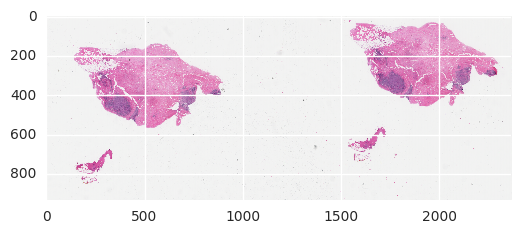

In [5]:
%matplotlib inline
# im = Image.open('../example_images/out.tiff', 'r')
arr_high = np.asarray(slide_high)
arr_low = np.asarray(slide_low)
plt.imshow(arr_low)

In [6]:
#print(arr[3700, 4000, :])
#print(arr[1500, 2000, :])

r = arr[:,:,0].flatten()
plt.hist(r, bins = 256)
g = arr[:,:,1].flatten()

b = arr[:,:,2].flatten()

a = arr[:,:,3].flatten()

g = arr[:,:,1].flatten()
plt.hist(g, bins = 256)
x = 1

b = arr[:,:,2].flatten()
plt.hist(b, bins = 256)
x = 2

a = arr[:,:,3].flatten()
print len(a[a<255])
#plt.hist(a[a<255], bins = 256)

for p in slide.properties:
    print p

In [7]:
print slide.properties['openslide.objective-power']
print slide.level_downsamples

40
(1.0, 4.0000396395444096, 16.00036997885835, 64.01859221489865)


In [8]:
bool_arr = arr_high[:, :, 0:3] < 200 # Get rid of opacity, threshold at 200
binary_arr = bool_arr.astype(int)
print binary_arr.shape

(14968, 37841, 3)


In [9]:
# The eventual patch size will actually be 1024, but with overlap of 512
def sumPixelsInPatch(image, patchSize=512):
    height, width, channels = image.shape
    new_height = int(math.ceil(float(height)/float(patchSize)))
    new_width = int(math.ceil(float(width)/float(patchSize)))
    new_image = np.ndarray(shape = (new_height, new_width, channels), dtype = int)
    for i in range(0, new_height):
        for j in range(0, new_width):
            idx = min(patchSize*i, height-patchSize)
            idy = min(patchSize*j, width-patchSize)
            new_image[i,j,:] = np.sum(image[idx:idx+patchSize, idy:idy+patchSize,:])
    return new_image

(117, 296, 3)


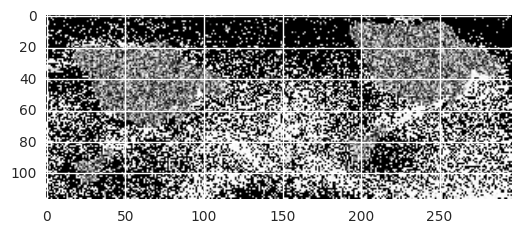

In [10]:
sum_arr = sumPixelsInPatch(binary_arr, int(math.ceil(float(512)/float(slide.level_downsamples[level_high]))))
print sum_arr.shape
plt.imshow(sum_arr)

In [11]:
# Class to hold the patch coordinates and density
class Patch(object):
    def __init__(self, x=0, y=0, density=0):
        self.x = x
        self.y = y
        self.density = density
    def __gt__(self, patch2):
        return self.density > patch2.density
    def __str__(self):
        return str([(self.x, self.y), self.density])
    def __repr__(self):
        return self.__str__()

# Returns the minimum Manhattan distance between all items in the heap and the coord. Returns smallest distance and the corresponding element.
def mdist(patches, new_patch):
    min_dist = sys.maxint
    for i in range(0, len(patches)):
        patch = patches[i]
        dist = abs(patch.x-new_patch.x)+abs(patch.y-new_patch.y)
        if dist < min_dist:
            min_dist = dist
            closest_patch_id = i
    return min_dist, closest_patch_id

# Store the densest patches in a min heap, check that they're at least a dist_th Manhattan distance away from all others
# Now just sorting, because heapq doesn't offer replace functionality. Should probably implement my own min heap.
def findKDensestPatches(image, k=10, dist_th = 4):
    height, width, channels = image.shape
    p = []
    for i in range(0, height-1):
        for j in range(0, width-1):
            density = np.sum(image[i:i+1,j:j+1,:])
            patch =  Patch(i, j, density)
            if len(p)<k: # Populate the list with the first 10 patches
                p.append(patch)
                p.sort()
            elif p[0].density < density: # This patch's density is higher than the min density in the list
                dist, closest_patch_id = mdist(p, patch)
                if dist < dist_th and p[closest_patch_id].density < density: # Replace the closest patch with this patch
                    p[closest_patch_id]=patch
                    p.sort()
                elif dist > dist_th: # Push this patch and pop the one with min density
                    p[0]=patch
                    p.sort()
    return p

In [12]:
densestPatches = findKDensestPatches(sum_arr, 10)
print densestPatches

[[(52, 37), 134844], [(24, 211), 134925], [(60, 52), 135252], [(42, 216), 136392], [(40, 219), 137037], [(46, 226), 137472], [(38, 212), 137547], [(43, 222), 137871], [(43, 221), 138012], [(45, 220), 138879]]


In [13]:
def getROICoords(densestPatches, patchSize=512):
    coords = []
    for patch in densestPatches:
        coords.append([patch.x*patchSize, patch.y*patchSize])
    return coords

In [14]:
level = 2
slide_med = slide.read_region((0, 0), level,
                              slide.level_dimensions[level])
coords = getROICoords(densestPatches, int(math.ceil(float(512)/float(slide.level_downsamples[level]))))
arr_med = np.asarray(slide_med)
print coords, arr_med.shape

[[1664, 1184], [768, 6752], [1920, 1664], [1344, 6912], [1280, 7008], [1472, 7232], [1216, 6784], [1376, 7104], [1376, 7072], [1440, 7040]] (3742, 9460, 4)


64 (3742, 9460, 4)
[1664, 1184]
[768, 6752]
[1920, 1664]
[1344, 6912]
[1280, 7008]
[1472, 7232]
[1216, 6784]
[1376, 7104]
[1376, 7072]
[1440, 7040]
1750 1416 65 49
1729 1492 63 81
1815 1414 85 78


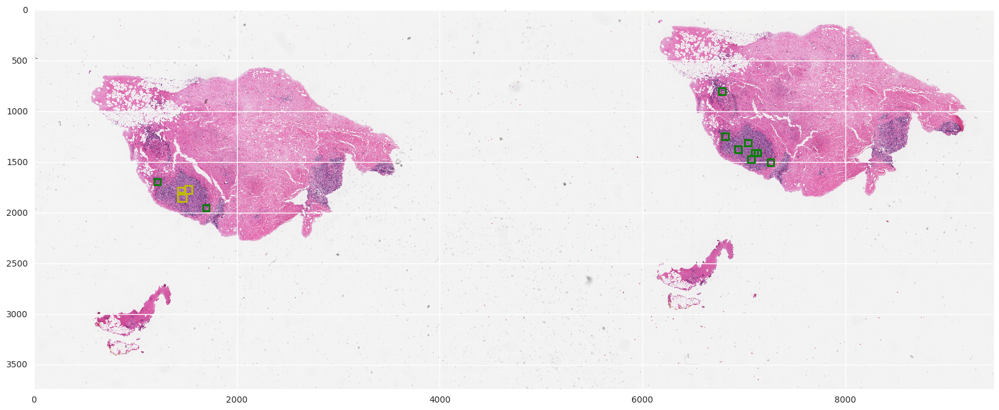

In [15]:
# Create figure and axes
fig,ax = plt.subplots(1)
fig.set_size_inches(20,20)
# Display the image
ax.imshow(arr_med)
height = int(math.ceil(float(1024)/float(slide.level_downsamples[level])))
print height, arr_med.shape

for coord in coords:
    print coord
    # Create a Rectangle patch
    rect = plp.Rectangle((coord[1], coord[0]),height,height,linewidth=2,edgecolor='g',facecolor='g', fill=False)
    # Add the patch to the Axes
    ax.add_patch(rect)

given_rois = [[22654,27990,1029,782],
                [23863,27652,1000,1281],
                [22617,29038,1345,1247]]

for roi in given_rois:
    x = int(math.ceil(float(roi[1])/float(slide.level_downsamples[level])))
    y = int(math.ceil(float(roi[0])/float(slide.level_downsamples[level])))
    height = int(math.ceil(float(roi[2])/float(slide.level_downsamples[level])))
    width = int(math.ceil(float(roi[3])/float(slide.level_downsamples[level])))
    print x, y, height, width
    # Create a Rectangle patch
    rect = plp.Rectangle((y, x), height, width,linewidth=2,edgecolor='y',facecolor='y', fill=False)
    # Add the patch to the Axes
    ax.add_patch(rect)

plt.show()

[26624, 18944]


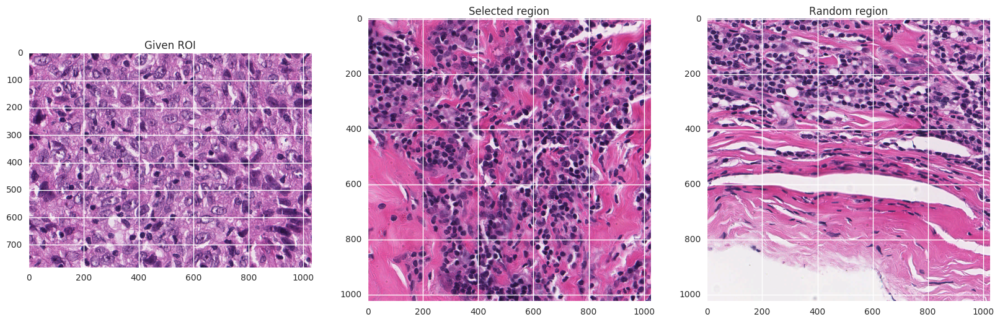

In [16]:
roi_region = slide.read_region((22654, 27990), 0,
                              (1029, 782))
selected_coords = getROICoords(densestPatches, 512)[0]
print selected_coords
selected_region = slide.read_region((selected_coords[1], selected_coords[0]), 0, (1024, 1024))
random_region = slide.read_region((24000, 32000), 0, (1024, 1024))

fig = plt.figure()
fig.set_size_inches(20,20)
a=fig.add_subplot(1,3,1)
imgplot = plt.imshow(roi_region)
a.set_title('Given ROI')
a=fig.add_subplot(1,3,2)
imgplot = plt.imshow(selected_region)
a.set_title('Selected region')
a=fig.add_subplot(1,3,3)
imgplot = plt.imshow(random_region)
a.set_title('Random region')

In [17]:
selected_region.save('../example_images/selected_region.tiff')

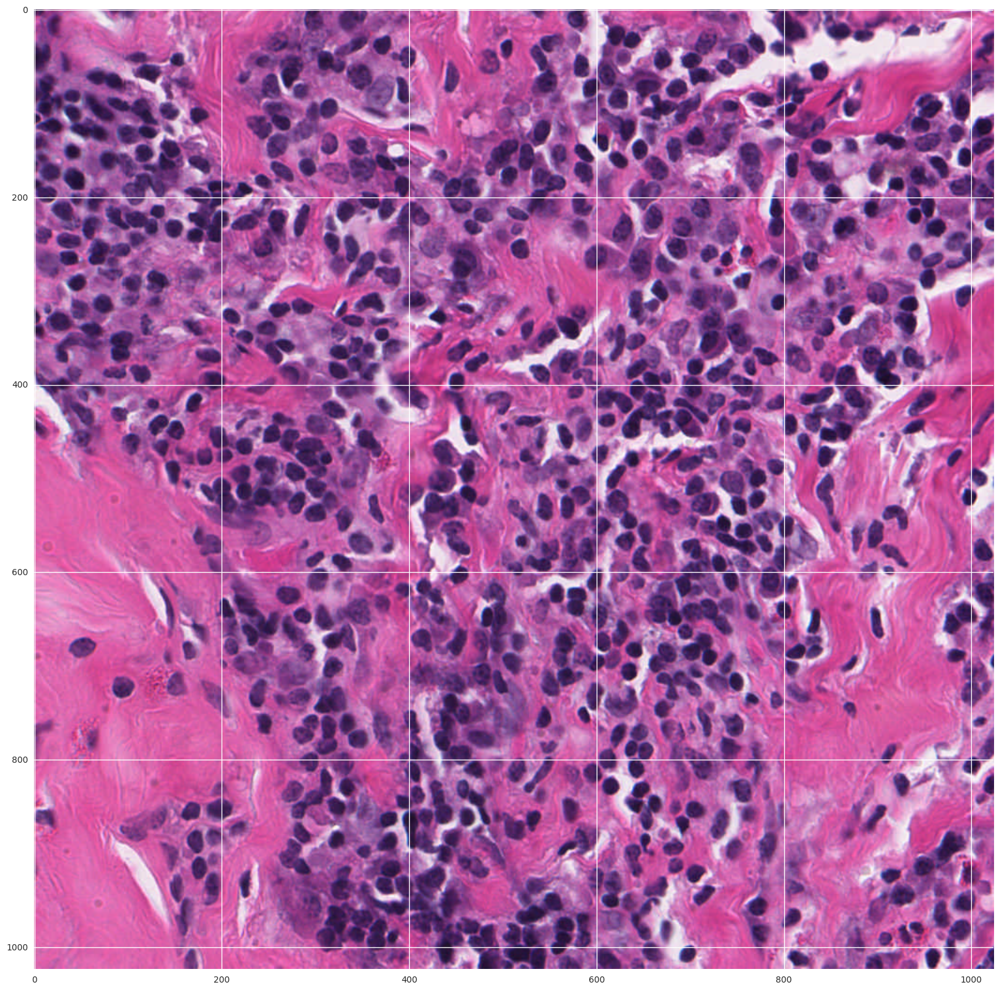

In [18]:
fig = plt.figure()
fig.set_size_inches(20,20)
imgplot = plt.imshow(selected_region)
a.set_title('Selected region')

(1024, 1024, 4)
(512, 512, 4)


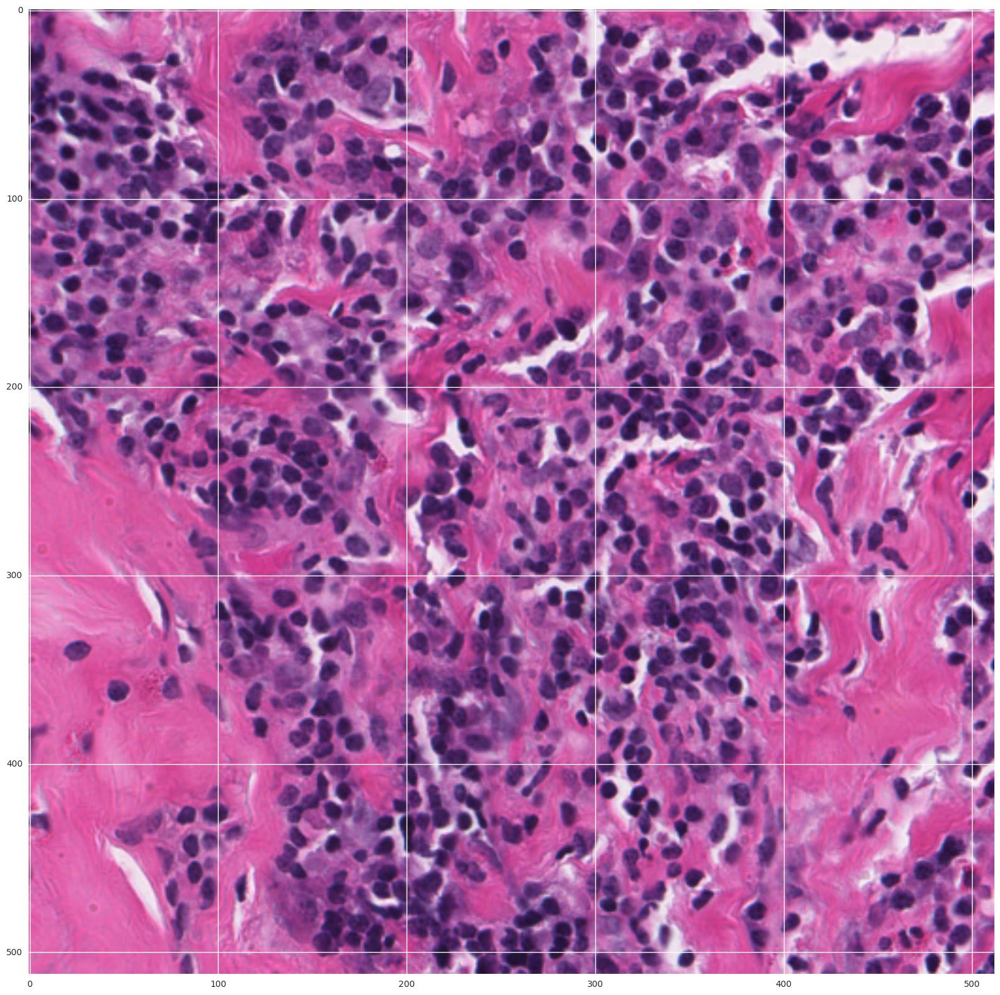

In [55]:
res = 512
print(np.asarray(selected_region).shape)
resized = cv2.resize(np.asarray(selected_region), (res, res), interpolation = cv2.INTER_AREA);
print(resized.shape)
fig = plt.figure()
fig.set_size_inches(20,20)
imgplot = plt.imshow(resized)
a.set_title('Selected region downsampled to {0}'.format(res))

In [52]:
resized_img = Image.fromarray(resized)
print(resized.shape)
#resized_img.save('../example_images/resized.tiff')

(512, 512, 4)


(array([ 236.,    0.,    0.,    0.,    0.,  117.,    0.,    0.,    0.,  147.]),
 array([ 1. ,  1.2,  1.4,  1.6,  1.8,  2. ,  2.2,  2.4,  2.6,  2.8,  3. ]),
 <a list of 10 Patch objects>)

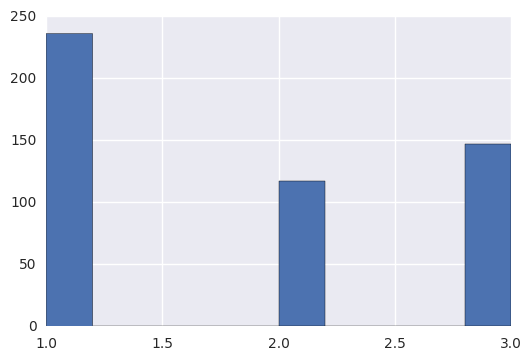

In [50]:
# Plot label distribution
annotations = open('../annotations/training_ground_truth.csv', 'r')
lines = annotations.readlines()
labels = []
for line in lines:
    labels.append([float(line.split(',')[0]), float(line.split(',')[1])])
labels = np.asarray(labels)
plt.hist(labels[:,0])

(array([ 40.,  48.,  55.,  45.,  50.,  59.,  82.,  68.,  38.,  15.]),
 array([-1.02132512, -0.84557994, -0.66983477, -0.49408959, -0.31834442,
        -0.14259924,  0.03314594,  0.20889111,  0.38463629,  0.56038147,
         0.73612664]),
 <a list of 10 Patch objects>)

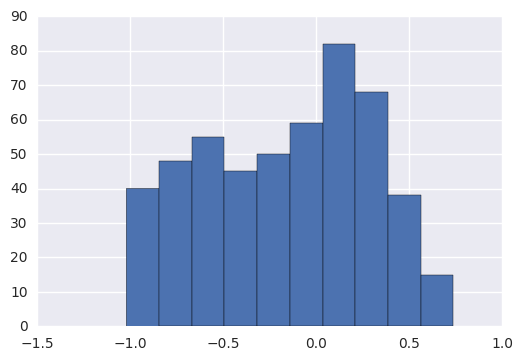

In [51]:
plt.hist(labels[:,1])

In [58]:
print(labels[:, 0])

[ 1.  2.  2.  2.  2.  1.  3.  1.  1.  1.  2.  3.  2.  1.  1.  1.  1.  1.
  3.  1.  2.  1.  3.  2.  1.  2.  2.  1.  3.  3.  1.  2.  3.  2.  1.  3.
  1.  2.  2.  2.  3.  1.  2.  1.  3.  3.  3.  2.  1.  1.  1.  1.  3.  2.
  1.  1.  1.  1.  3.  1.  1.  3.  3.  1.  2.  1.  3.  1.  3.  1.  2.  1.
  2.  2.  3.  2.  3.  1.  1.  3.  3.  2.  1.  3.  1.  2.  2.  2.  3.  2.
  1.  2.  2.  1.  2.  3.  3.  2.  1.  1.  1.  2.  2.  3.  1.  3.  2.  3.
  1.  3.  2.  1.  1.  1.  2.  1.  2.  2.  2.  1.  3.  3.  1.  3.  3.  1.
  3.  1.  1.  1.  1.  3.  3.  2.  2.  1.  3.  3.  1.  1.  1.  1.  2.  1.
  1.  2.  3.  2.  1.  1.  2.  3.  1.  2.  3.  2.  2.  3.  3.  3.  3.  3.
  1.  1.  3.  1.  3.  1.  1.  1.  1.  3.  1.  2.  3.  1.  1.  3.  2.  1.
  2.  1.  1.  1.  2.  3.  3.  1.  2.  1.  1.  3.  3.  3.  3.  1.  3.  1.
  2.  2.  1.  2.  1.  1.  1.  3.  3.  2.  1.  1.  2.  1.  1.  1.  3.  1.
  1.  1.  3.  1.  1.  1.  2.  1.  2.  2.  3.  1.  3.  3.  2.  1.  3.  1.
  1.  1.  3.  2.  2.  3.  1.  1.  2.  2.  3.  1.  1